In [1]:
import nltk
# Prevent nltk.download from fetching data
nltk.download = lambda *args, **kwargs: None

# Stub stopwords.words to return an empty list
class DummyStopwords:
    @staticmethod
    def words(lang):
        return []
nltk.corpus.stopwords = DummyStopwords

# Stub tokenizer functions to simple splits
import nltk.tokenize
nltk.tokenize.word_tokenize = lambda text: text.split()
nltk.tokenize.sent_tokenize = lambda text: text.split('.')


# Bibliometric Analysis: ESG and Supply Chain

This notebook provides a clean, modular workflow for bibliometric analysis using a merged dataset (`merged_clean.csv`). Steps include:
1. Environment setup and imports
2. Data loading and cleaning
3. Publications per year
4. Top journals analysis
5. Keyword frequency analysis
6. Co‑occurrence network visualization


In [2]:

# 1. Environment Setup
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx

%matplotlib inline
plt.style.use('default')


In [3]:

# 2. Load and Inspect Data
df = pd.read_csv('merged_clean.csv')
print(f"Dataset shape: {df.shape}")
df.head()


Dataset shape: (1738, 91)


,authors,Author full names,Author(s) ID,title,year,journal,Volume,Issue,Art. No.,Page start,...,Web of Science Index,Research Areas,IDS Number,Pubmed Id,Open Access Designations,Highly Cited Status,Hot Paper Status,Date of Export,UT (Unique WOS ID),Web of Science Record
0,zeng h.; li r.y.m.; zeng l.,"Zeng, Huiling (57928967900); Li, Rita Yi Man (...",57928967900; 35189135600; 57745627500,evaluating green supply chain performance base...,2022.0,frontiers in environmental science,10.0,NaN,982828,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,li l.; liu x.; hu m.,"Li, Linze (57304193500); Liu, Xuexin (55750784...",57304193500; 55750784400; 57730231600,textile and apparel supply chain coordination ...,2024.0,journal of cleaner production,437.0,NaN,140491,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,karaman a.s.; ellili n.o.d.; uyar a.,"Karaman, Abdullah S. (36850344100); Ellili, Ne...",36850344100; 39261406000; 24448916800,do sustainable supply chain practices mitigate...,2024.0,business strategy and the environment,33.0,8,NaN,8126.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,memari z.; niazitabar m.; dickson g.; pouyande...,"Memari, Zhaleh (57219186290); Niazitabar, Mary...",57219186290; 59299328800; 7103204907; 57221603217,"corporate social responsibility, supply chain ...",2024.0,sport in society,27.0,10,NaN,1624.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,ortas e.; álvarez i.; garayar a.,"Ortas, Eduardo (35737853000); Álvarez, Igor (5...",35737853000; 56522498600; 56523342900,"the environmental, social, governance, and fin...",2015.0,sustainability (switzerland),7.0,2,NaN,1932.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
# Normalize column names to snake_case and drop duplicate columns
df.columns = (
    df.columns
    .str.strip()
    .str.lower()
    .str.replace(' ', '_')
    .str.replace('[^a-z0-9_]', '', regex=True)
)
df = df.loc[:, ~df.columns.duplicated()]

In [5]:

# 3. Data Cleaning
# Standardize column names
df.columns = df.columns.str.strip().str.lower().str.replace(' ', '_')
# Drop duplicates and missing titles/years
df = df.drop_duplicates(subset=['title', 'year']).dropna(subset=['title', 'year'])
df['year'] = df['year'].astype(int)


In [6]:
df['country'] = df['affiliations'].str.strip().str.split(',').str[-1].str.strip()


country
China             145
India              76
Italy              63
United Kingdom     47
United States      45
Spain              36
South Korea        36
Indonesia          23
Taiwan             21
Malaysia           21
Name: count, dtype: int64


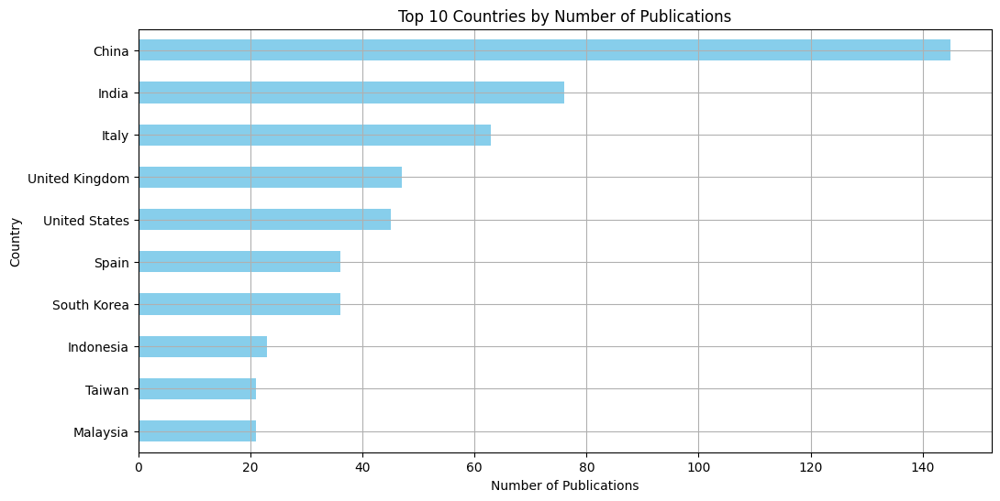

In [7]:
print(df['country'].value_counts().head(10))
plt.figure(figsize=(12, 6))
df['country'].value_counts().head(10).plot(kind='barh', color='skyblue',grid=True)
plt.gca().invert_yaxis()  # Invert y-axis to have the highest count on top
plt.title('Top 10 Countries by Number of Publications')
plt.xlabel('Number of Publications')
plt.ylabel('Country')
plt.show()

In [8]:
df.columns



Index(['authors', 'author_full_names', 'authors_id', 'title', 'year',
       'journal', 'volume', 'issue', 'art_no', 'page_start', 'page_end',
       'page_count', 'cited_by', 'doi', 'link', 'affiliations',
       'authors_with_affiliations', 'abstract', 'keywords', 'index_keywords',
       'correspondence_address', 'language_of_original_document',
       'abbreviated_source_title', 'document_type', 'publication_stage',
       'open_access', 'source', 'publication_type', 'book_authors',
       'book_editors', 'book_group_authors', 'book_author_full_names',
       'group_authors', 'article_title', 'source_title', 'book_series_title',
       'book_series_subtitle', 'language', 'conference_title',
       'conference_date', 'conference_location', 'conference_sponsor',
       'conference_host', 'keywords_plus', 'addresses', 'reprint_addresses',
       'email_addresses', 'researcher_ids', 'orcids', 'funding_orgs',
       'funding_name_preferred', 'funding_text', 'cited_references',
       'c

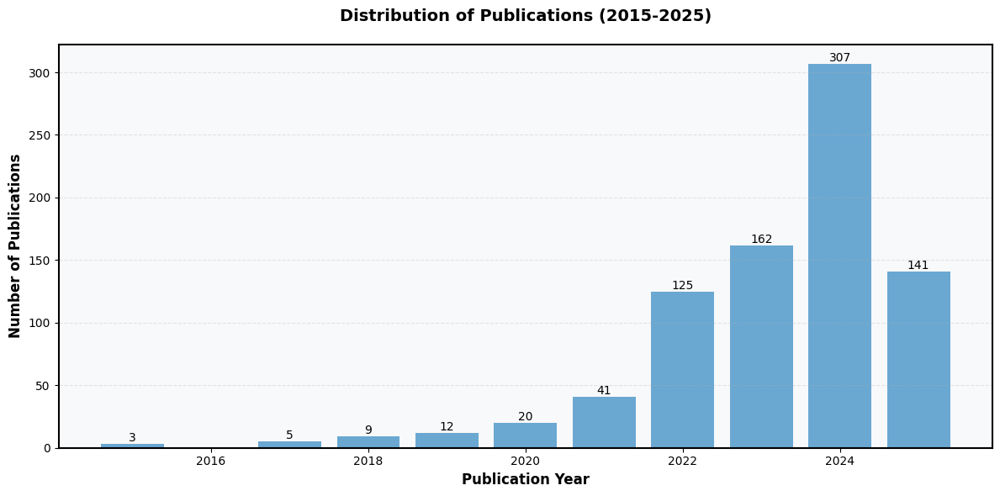

In [9]:

# 4. Publications per Year
plt.figure(figsize=(12, 6))
pubs_per_year = df.groupby('year').size()
# Create the bar plot with a modern color and alpha
bars = plt.bar(pubs_per_year.index, pubs_per_year.values, 
               color='#2E86C1', alpha=0.7)

# Add value labels on top of each bar
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height,
             f'{int(height)}',
             ha='center', va='bottom')

# Customize the plot
plt.xlabel('Publication Year', fontsize=12, fontweight='bold')
plt.ylabel('Number of Publications', fontsize=12, fontweight='bold')
plt.title('Distribution of Publications (2015-2025)', 
          fontsize=14, fontweight='bold', pad=20)

# Customize the grid
plt.grid(True, axis='y', linestyle='--', alpha=0.3)

# Customize the spines
for spine in plt.gca().spines.values():
    spine.set_linewidth(1.5)

# Rotate x-axis labels
plt.xticks(rotation=0)

# Adjust layout
plt.tight_layout()

# Add a light gray background
plt.gca().set_facecolor('#f8f9fa')
plt.gcf().set_facecolor('white')


journal
sustainability (switzerland)                                    91
business strategy and the environment                           42
corporate social responsibility and environmental management    41
journal of cleaner production                                   37
total quality management and business excellence                18
sustainable development                                         17
business strategy and development                               14
environment, development and sustainability                     14
research in international business and finance                  10
journal of business research                                     9
Name: count, dtype: int64


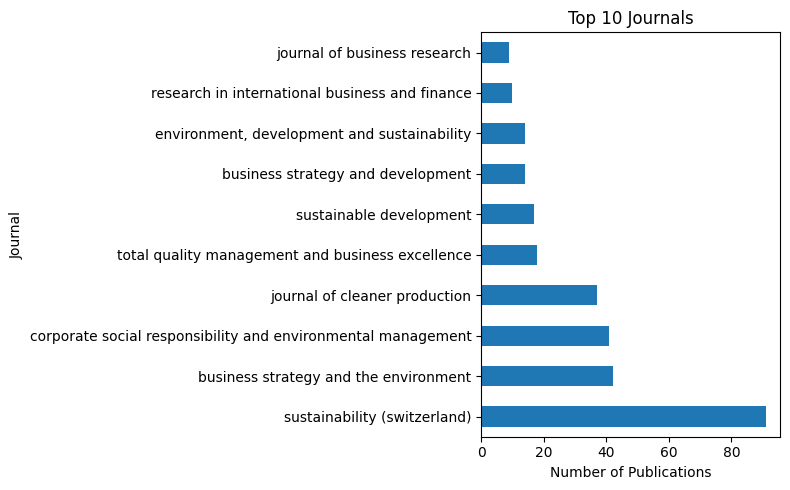

In [10]:

# 5. Top Journals
if 'journal' in df.columns:
    top_journals = df['journal'].value_counts().head(10)
    print(top_journals)
    top_journals.plot(kind='barh', figsize=(8, 5))
    plt.xlabel('Number of Publications')
    plt.ylabel('Journal')
    plt.title('Top 10 Journals')
    plt.tight_layout()
else:
    print("No 'journal' column found.")


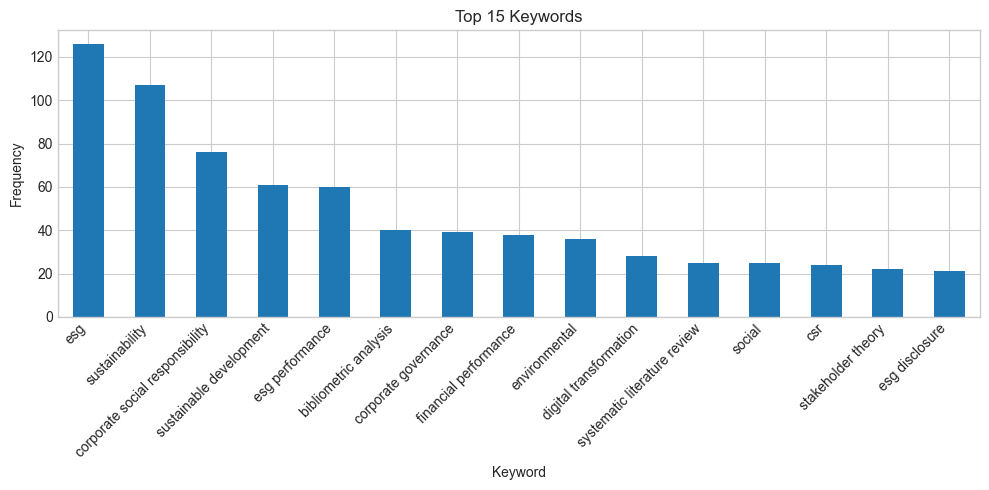

In [25]:

# 6. Keyword Frequency Analysis
# Expecting keywords in a semicolon-separated 'keywords' column
if 'keywords' in df.columns:
    kw_series = df['keywords'].dropna().str.split(';').explode().str.strip().str.lower()
    top_keywords = kw_series.value_counts().head(15)
    top_keywords.plot(kind='bar', figsize=(10, 5))
    plt.xticks(rotation=45, ha='right')
    plt.xlabel('Keyword')
    plt.ylabel('Frequency')
    plt.title('Top 15 Keywords')
    plt.tight_layout()
else:
    print("No 'keywords' column found.")


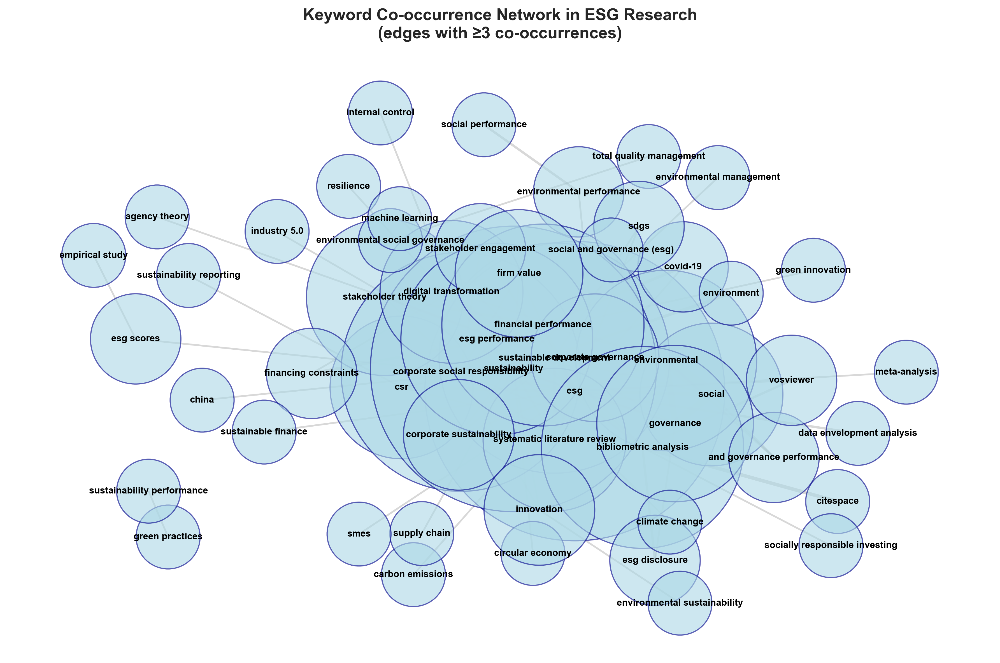

In [12]:
# 7. Co-occurrence Network of Keywords
if 'keywords' in df.columns:
    from itertools import combinations
    import seaborn as sns
    import matplotlib.pyplot as plt
    import networkx as nx

    # Set style for publication quality
    sns.set_style('whitegrid')  # <--- FIXED HERE

    # Create co-occurrence dictionary
    cooc = {}
    for kws in df['keywords'].dropna().str.split(';'):
        cleaned = [k.strip().lower() for k in kws]
        for a, b in combinations(set(cleaned), 2):
            cooc[(a, b)] = cooc.get((a, b), 0) + 1

    # Create graph
    G = nx.Graph()
    for (a, b), w in cooc.items():
        if w >= 3:  # threshold for visibility
            G.add_edge(a, b, weight=w)
    
    # Set up the figure with high DPI for publication
    plt.figure(figsize=(12, 8), dpi=300)

    # Calculate node sizes based on degree centrality
    node_size = [3000 * G.degree(node) for node in G.nodes()]

    # Calculate edge weights for width
    edge_weights = [G[u][v]['weight']*0.5 for u, v in G.edges()]

    # Generate layout
    pos = nx.spring_layout(G, k=1, iterations=50)

    # Draw the network
    nx.draw_networkx_edges(G, pos, width=edge_weights, alpha=0.3, edge_color='gray')

    # Draw nodes
    nodes = nx.draw_networkx_nodes(G, pos, node_size=node_size, node_color='lightblue', alpha=0.6)
    nodes.set_edgecolor('darkblue')

    # Add labels with enhanced visibility
    nx.draw_networkx_labels(G, pos, font_size=8, font_weight='bold', font_family='sans-serif')

    # Customize the plot
    plt.title('Keyword Co-occurrence Network in ESG Research\n(edges with ≥3 co-occurrences)', 
              fontsize=14, fontweight='bold', pad=20)

    # Remove axes for cleaner look
    plt.axis('off')

    # Set background to white
    plt.gca().set_facecolor('white')
    plt.gcf().set_facecolor('white')

    # Adjust layout
    plt.tight_layout()

    plt.show()
else:
    print("No 'keywords' column found.")


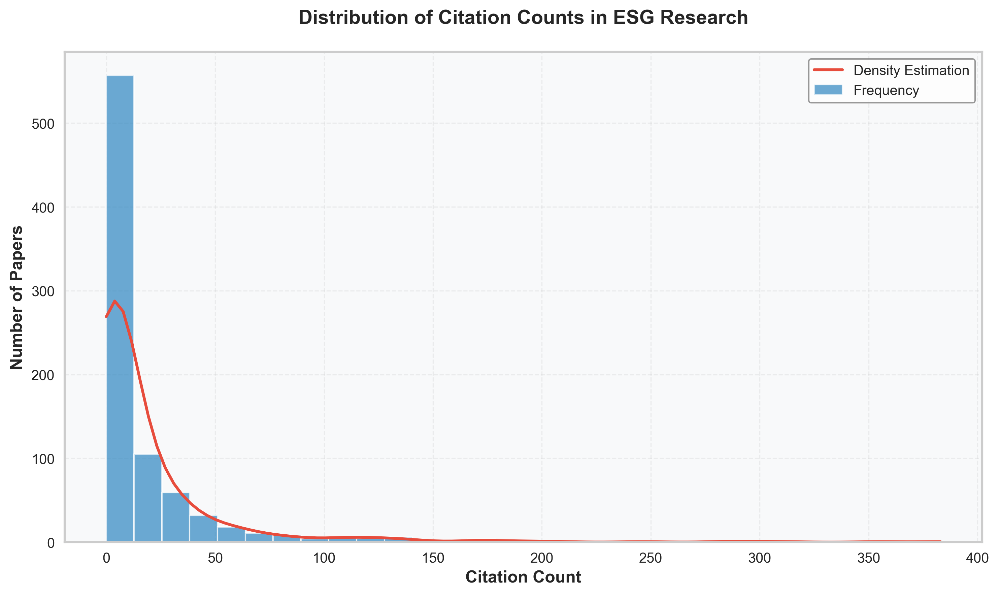

In [13]:
from scipy import stats

# 8. Citation Count Distribution with Enhanced Visualization
if 'cited_by' in df.columns:
    # Set figure size and style for publication quality
    plt.figure(figsize=(10, 6), dpi=300)
    
    # Create histogram with enhanced aesthetics
    n, bins, patches = plt.hist(df['cited_by'].dropna().astype(int), 
                              bins=30, 
                              color='#2E86C1',
                              alpha=0.7,
                              edgecolor='white')
    
    # Add a smooth KDE curve
    kde_xs = np.linspace(0, df['cited_by'].max(), 100)
    kde = stats.gaussian_kde(df['cited_by'].dropna())
    plt.plot(kde_xs, kde(kde_xs) * len(df['cited_by'].dropna()) * (bins[1] - bins[0]),
             color='#E74C3C', linewidth=2, label='Density Curve')
    
    # Customize the axes
    plt.xlabel('Citation Count', fontsize=12, fontweight='bold')
    plt.ylabel('Number of Papers', fontsize=12, fontweight='bold')
    plt.title('Distribution of Citation Counts in ESG Research', 
              fontsize=14, fontweight='bold', pad=20)
    
    # Add grid for better readability
    plt.grid(True, alpha=0.3, linestyle='--')
    
    # Customize the spines
    for spine in plt.gca().spines.values():
        spine.set_linewidth(1.5)
    
    # Add legend
    plt.legend(['Density Estimation', 'Frequency'], 
              frameon=True, 
              facecolor='white', 
              edgecolor='gray')
    
    # Set background color
    plt.gca().set_facecolor('#f8f9fa')
    plt.gcf().set_facecolor('white')
    
    # Tight layout to prevent label cutoff
    plt.tight_layout()
    
    plt.show()
else:
    print("No 'cited_by' column found.")

                                                 title  cited_by
146  integrating environmental, social and governan...     383.0
433  corporate social performance, analyst stock re...     355.0
260  transparency among s&p 500 companies: an analy...     310.0
775  the determinants of business contribution to t...     293.0
508  esg disclosure and firm performance: a bibliom...     285.0
262  how do companies respond to environmental, soc...     246.0
430  fintech and smes sustainable business models: ...     206.0
234  the impact of social, environmental and corpor...     196.0
403  meta-analyses on corporate social responsibili...     187.0
24   a decision-making framework for industry 4.0 t...     176.0


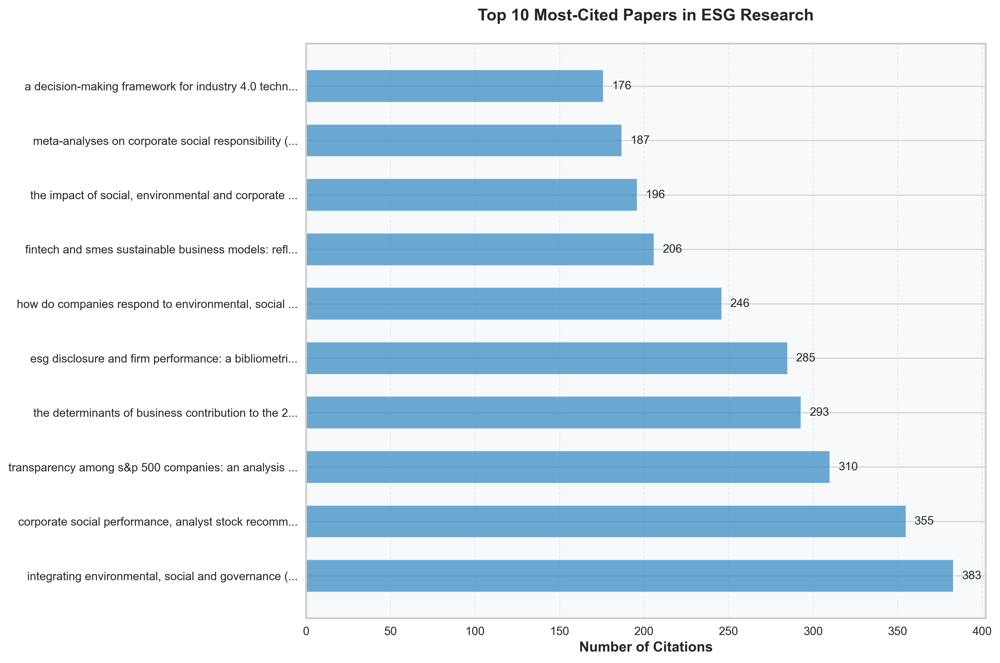

In [14]:
# 9. Top 10 Most-Cited Papers with Enhanced Visualization
if 'cited_by' in df.columns:
    # Get top 10 cited papers
    top_cited = df.nlargest(10, 'cited_by')[['title', 'cited_by']]
    print(top_cited)
    # Create figure with higher resolution
    plt.figure(figsize=(12, 8), dpi=300)
    
    # Create horizontal bar plot with enhanced styling
    bars = plt.barh(
        range(len(top_cited)), 
        top_cited['cited_by'],
        color='#2E86C1',  # Professional blue color
        alpha=0.7,
        height=0.6
    )
    
    # Add value labels on the bars
    for i, bar in enumerate(bars):
        width = bar.get_width()
        plt.text(width + 5, bar.get_y() + bar.get_height()/2,
                f'{int(width)}',
                ha='left', va='center',
                fontsize=10)
    
    # Customize titles and labels
    plt.title('Top 10 Most-Cited Papers in ESG Research',
              fontsize=14, fontweight='bold', pad=20)
    plt.xlabel('Number of Citations',
              fontsize=12, fontweight='bold')
    
    # Customize y-axis with truncated titles
    titles = [t[:50] + '...' if len(t) > 50 else t 
             for t in top_cited['title']]
    plt.yticks(range(len(titles)), titles)
    
    # Customize the spines
    for spine in plt.gca().spines.values():
        spine.set_linewidth(1.5)
    
    # Add grid for better readability
    plt.grid(True, axis='x', linestyle='--', alpha=0.3)
    
    # Set background colors
    plt.gca().set_facecolor('#f8f9fa')
    plt.gcf().set_facecolor('white')
    
    # Adjust layout
    plt.tight_layout()
    
    plt.show()
else:
    print("No 'cited_by' column found.")

author_full_names
Lim, Weng Marc (57193912670)                  9
Kumar, Satish (57992552600)                   7
Karaman, Abdullah S. (36850344100)            6
Uyar, Ali (24448916800)                       6
Elsheikh, Tamer (57996567800)                 5
Almaqtari, Faozi A. (57204105724)             5
Lu, Wen-Min (25625212800)                     5
Rajesh, R. (56421718400)                      4
Tripopsakul, Suchart (57188841299)            4
Pizzi, Simone (57195278596)                   4
Puriwat, Wilert (57188838329)                 4
Saini, Neha (59579900800)                     4
García-Sánchez, Isabel-María (57193363767)    4
Kweh, Qian Long (55661469500)                 3
Leopizzi, Rossella (56543649300)              3
Name: count, dtype: int64


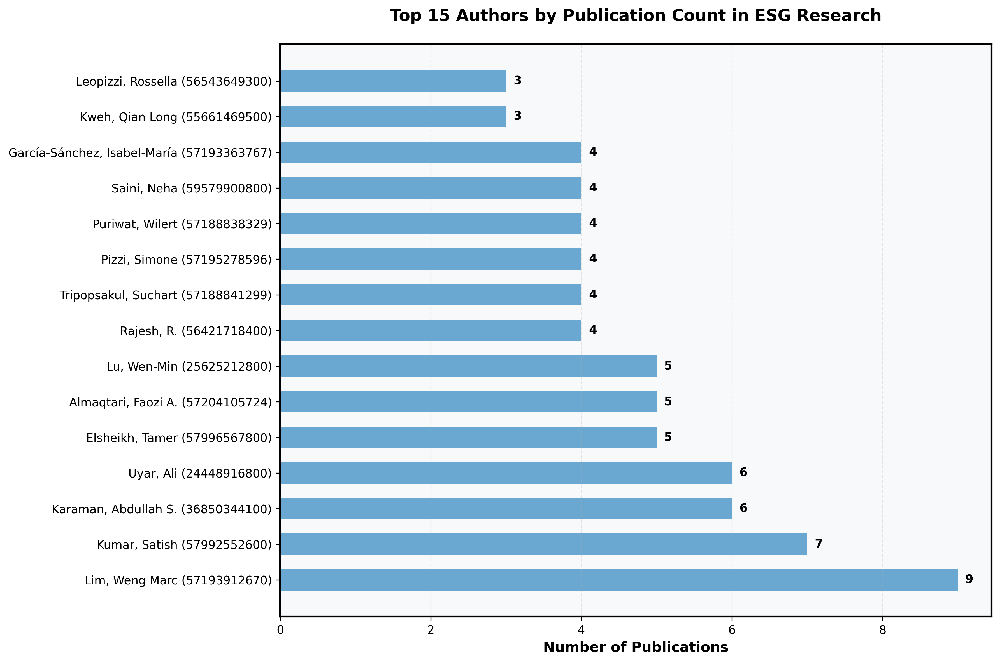

In [15]:
# 10. Publications per Author with Enhanced Visualization
if 'author_full_names' in df.columns:
    # Set figure style for publication quality
    plt.style.use('default')
    plt.figure(figsize=(12, 8), dpi=300)
    
    # Get top authors and their publication counts
    auth = df['author_full_names'].dropna().str.split(';').explode().str.strip()
    top_authors = auth.value_counts().head(15)
    print(top_authors)
    
    # Create horizontal bar plot with enhanced styling
    bars = plt.barh(
        range(len(top_authors)),
        top_authors.values,
        color='#2E86C1',
        alpha=0.7,
        height=0.6
    )
    
    # Add value labels on bars
    for i, v in enumerate(top_authors.values):
        plt.text(v + 0.1, i, str(int(v)), 
                va='center', fontsize=10, fontweight='bold')
    
    # Customize axes and labels
    plt.yticks(range(len(top_authors)), top_authors.index, fontsize=10)
    plt.xlabel('Number of Publications', fontsize=12, fontweight='bold')
    plt.title('Top 15 Authors by Publication Count in ESG Research',
              fontsize=14, fontweight='bold', pad=20)
    
    # Customize spines
    for spine in plt.gca().spines.values():
        spine.set_linewidth(1.5)
        
    # Add grid for better readability
    plt.grid(True, axis='x', linestyle='--', alpha=0.3)
    
    # Set background colors
    plt.gca().set_facecolor('#f8f9fa')
    plt.gcf().set_facecolor('white')
    
    # Adjust layout to prevent label cutoff
    plt.tight_layout()
    
    plt.show()
else:
    print("No 'author_full_names' column found.")

C:\Users\00010\AppData\Local\Temp\ipykernel_18744\2124758666.py:31: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


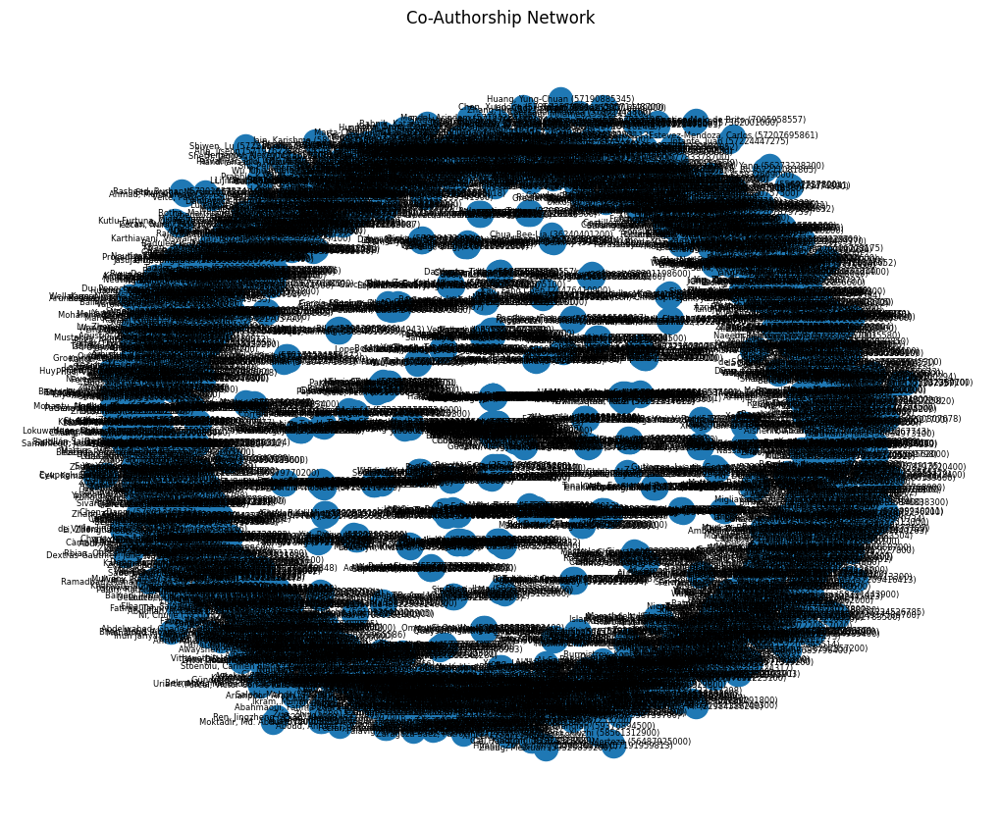

In [16]:
import networkx as nx
import matplotlib.pyplot as plt
from itertools import combinations

# 1. Check that the column exists
if 'author_full_names' not in df.columns:
    raise KeyError("DataFrame must contain 'author_full_names' column")

# 2. Build the graph
G = nx.Graph()
for authors in df['author_full_names'].dropna():
    names = [a.strip() for a in authors.split(';') if a.strip()]
    for u, v in combinations(names, 2):
        if G.has_edge(u, v):
            G[u][v]['weight'] += 1
        else:
            G.add_edge(u, v, weight=1)

# 3. Simple plot
plt.figure(figsize=(10, 8))
pos = nx.spring_layout(G)            # default force-directed layout
nx.draw(
    G, pos,
    with_labels=True,                 # show all author names
    node_size=300,                    # fixed node size
    font_size=6,                      # small font to reduce overlap
    edge_color='gray',                # simple edge color
)
plt.title("Co-Authorship Network")
plt.axis('off')
plt.tight_layout()
plt.show()


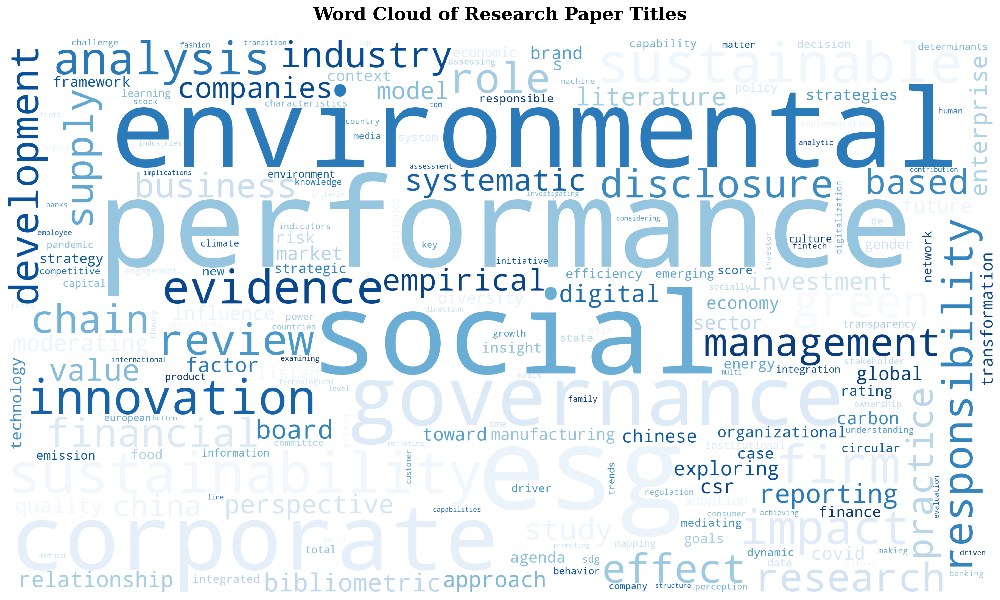

In [17]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt

# 1. Prepare text
text = ' '.join(df['title'].dropna())

# 2. Build stopword set (add any domain-specific words you want to exclude)
stopwords = set(STOPWORDS)
stopwords.update(['et', 'al', 'using', 'via'])  

# 3. Configure and generate the word cloud
wc = WordCloud(
    width=1600,
    height=900,
    background_color='white',
    stopwords=stopwords,
    max_words=200,
    collocations=False,         # don’t combine bigrams
    max_font_size=200,
    scale=2,                    # render at 2× resolution for smoothness
    colormap='Blues'            # professional blue color scheme
).generate(text)

# 4. Plot
plt.figure(figsize=(16, 9), dpi=300)
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')

plt.title(
    'Word Cloud of Research Paper Titles',
    fontsize=20,
    fontweight='bold',
    pad=20,
    fontfamily='serif'
)
plt.tight_layout(pad=0)
plt.show()


Topic 1: performance, esg, social, study, corporate, csr, environmental, firms, firm, governance
Topic 2: supply, chain, industry, companies, emissions, study, carbon, environmental, sustainability, sustainable
Topic 3: sustainability, study, environmental, social, performance, brand, governance, organizational, practices, sustainable
Topic 4: esg, research, sustainability, study, sustainable, analysis, literature, social, environmental, reporting
Topic 5: esg, performance, green, innovation, environmental, digital, enterprises, corporate, companies, firms


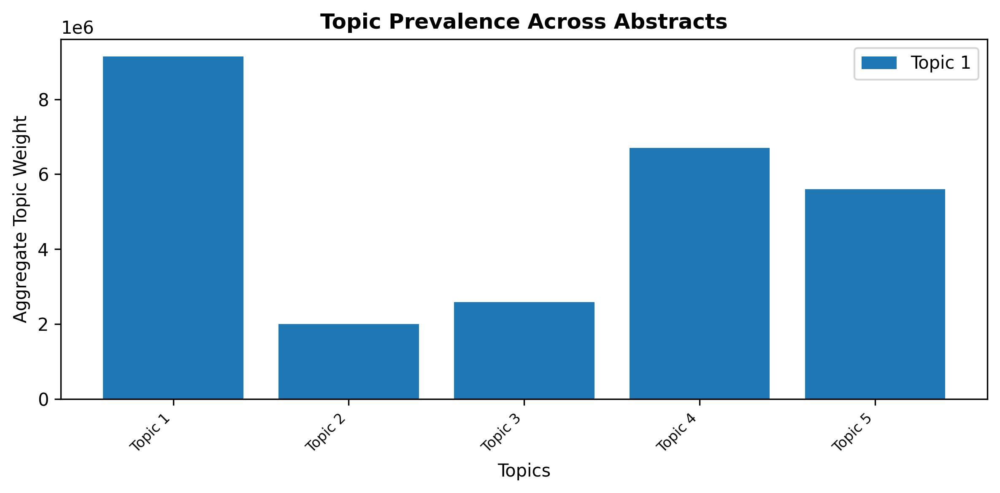

In [18]:
# 13. Topic Modeling on Abstracts (LDA) — sklearn version
if 'abstract' in df.columns:
    from sklearn.feature_extraction.text import CountVectorizer
    from sklearn.decomposition import LatentDirichletAllocation
    import matplotlib.pyplot as plt

    # 1. Preprocess and vectorize
    vectorizer = CountVectorizer(
        max_df=0.95,    # ignore very frequent terms
        min_df=2,       # ignore very rare terms
        stop_words='english',
        token_pattern=r'\b[a-zA-Z]{3,}\b'  # only words ≥3 letters
    )
    X = vectorizer.fit_transform(df['abstract'].dropna().str.lower())

    # 2. Fit LDA
    n_topics = 5
    lda = LatentDirichletAllocation(
        n_components=n_topics,
        max_iter=10,
        learning_method='batch',
        random_state=0
    )
    lda.fit(X)

    # 3. Helper to display top words per topic
    def print_top_words(model, feature_names, n_top_words=10):
        for topic_idx, topic in enumerate(model.components_):
            top_features = topic.argsort()[::-1][:n_top_words]
            top_words = [feature_names[i] for i in top_features]
            print(f"Topic {topic_idx+1}: " + ", ".join(top_words))

    print_top_words(lda, vectorizer.get_feature_names_out())

    # 4. (Optional) Bar chart of topic prevalence
    topic_counts = X.dot(lda.components_.T).sum(axis=0)
    topics = [f"Topic {i+1}" for i in range(n_topics)]

    plt.figure(figsize=(8, 4), dpi=300)
    plt.bar(topics, topic_counts)
    plt.xticks(rotation=45, ha='right', fontsize=8)
    plt.ylabel("Aggregate Topic Weight")
    plt.legend({'Topic 1':'performance, esg, social, study, corporate, csr, environmental, firms, firm, governance',
                'Topic 2':'supply, chain, industry, companies, emissions, study, carbon, environmental, sustainability, sustainable',
                'Topic 3':'sustainability, study, environmental, social, performance, brand, governance, organizational, practices, sustainable',
                'Topic 4':'esg, research, sustainability, study, sustainable, analysis, literature, social, environmental, reporting',
                'Topic 5':'esg, performance, green, innovation, environmental, digital, enterprises, corporate, companies, firms'})
    plt.xlabel("Topics")
    plt.title("Topic Prevalence Across Abstracts", fontweight='bold')
    plt.tight_layout()
    plt.show()

else:
    print("No 'abstract' column found.")


0                   carbon emissions
1                                esg
2                 green supply chain
3                              index
4           supply chain performance
5                   esg cost-sharing
6                  stochastic demand
7                supply chain system
8     textile and apparel industries
9                    carbon emission
10                      esg training
11                green supply chain
12                stakeholder theory
13          sustainable supply chain
14                          business
Name: keywords, dtype: object


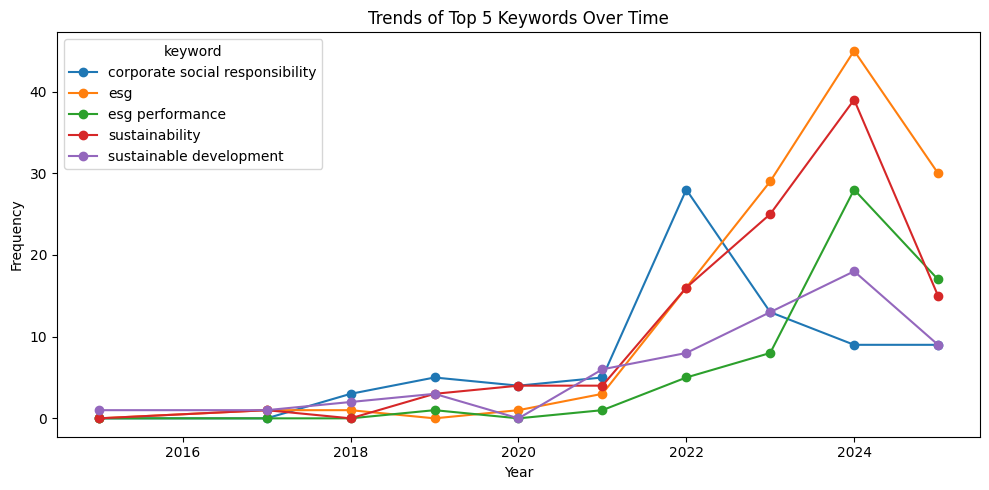

In [19]:
# 14. Keyword Trends Over Time
if 'keywords' in df.columns:
    from itertools import combinations
    kw = df['keywords'].dropna().str.split(';').explode().str.strip().str.lower()
    print(kw.head(15).reset_index(drop=True))
    top5 = kw.value_counts().head(5).index
    trend = (
        df.dropna(subset=['keywords'])
          .assign(keyword_list=lambda d: d['keywords'].str.split(';'))
          .explode('keyword_list')
          .assign(keyword=lambda d: d['keyword_list'].str.strip().str.lower())
          .query("keyword in @top5")
          .groupby(['year','keyword']).size()
          .unstack(fill_value=0)
    )
    trend.plot(figsize=(10,5), marker='o')
    plt.xlabel('Year')
    plt.ylabel('Frequency')
    plt.title('Trends of Top 5 Keywords Over Time')
    plt.tight_layout()
    plt.show()
else:
    print("No 'keywords' column found.")

                                               authors  cited_by
146                lokuwaduge c.s.d.s.; heenetigala k.     383.0
433              luo x.; wang h.; raithel s.; zheng q.     355.0
260                        tamimi n.; sebastianelli r.     310.0
775                 pizzi s.; rosati f.; venturelli a.     293.0
508                                          khan m.a.     285.0
262                          clementino e.; perkins r.     246.0
430                      pizzi s.; corbo l.; caputo a.     206.0
234                                  aboud a.; diab a.     196.0
403                                           velte p.     187.0
24   soni g.; kumar s.; mahto r.v.; mangla s.k.; mi...     176.0


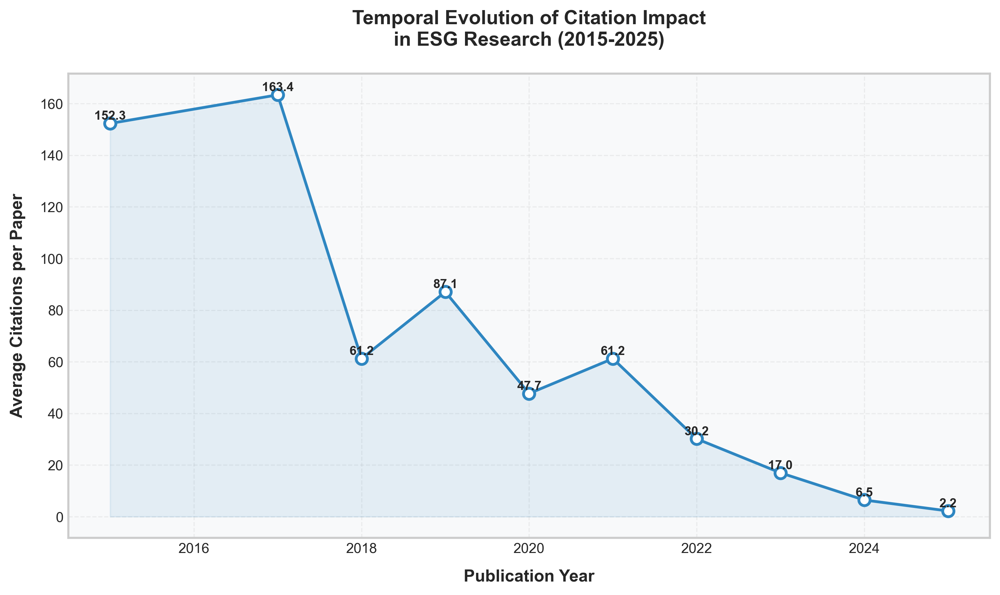

In [20]:
# 15. Annual Average Citations with Enhanced Visualization
if 'cited_by' in df.columns:
    print(df[['authors','cited_by']].sort_values('cited_by', ascending=False).head(10)) 
    
    # Set figure style for publication quality
    plt.style.use('seaborn-v0_8-whitegrid')
    plt.figure(figsize=(10, 6), dpi=300)
    
    # Calculate average citations
    avg_cite = df.groupby('year')['cited_by'].mean()
    
    # Create line plot with markers
    line = plt.plot(avg_cite.index, avg_cite.values, 
                   marker='o',
                   linewidth=2,
                   markersize=8,
                   color='#2E86C1',  # Professional blue color
                   linestyle='-',
                   markerfacecolor='white',
                   markeredgewidth=2)
    
    # Add data points labels
    for x, y in zip(avg_cite.index, avg_cite.values):
        plt.text(x, y + 0.5, f'{y:.1f}', 
                ha='center', va='bottom',
                fontsize=9,
                fontweight='bold')
    
    # Customize axes
    plt.xlabel('Publication Year', fontsize=12, fontweight='bold', labelpad=10)
    plt.ylabel('Average Citations per Paper', fontsize=12, fontweight='bold', labelpad=10)
    plt.title('Temporal Evolution of Citation Impact\nin ESG Research (2015-2025)',
              fontsize=14, fontweight='bold', pad=20)
    
    # Customize grid
    plt.grid(True, linestyle='--', alpha=0.3)
    
    # Customize spines
    for spine in plt.gca().spines.values():
        spine.set_linewidth(1.5)
    
    # Set background colors
    plt.gca().set_facecolor('#f8f9fa')
    plt.gcf().set_facecolor('white')
    
    # Add subtle shading under the line
    plt.fill_between(avg_cite.index, avg_cite.values, 
                    alpha=0.1, color='#2E86C1')
    
    # Adjust layout
    plt.tight_layout()
    
    plt.show()
else:
    print("No 'cited_by' column found.")

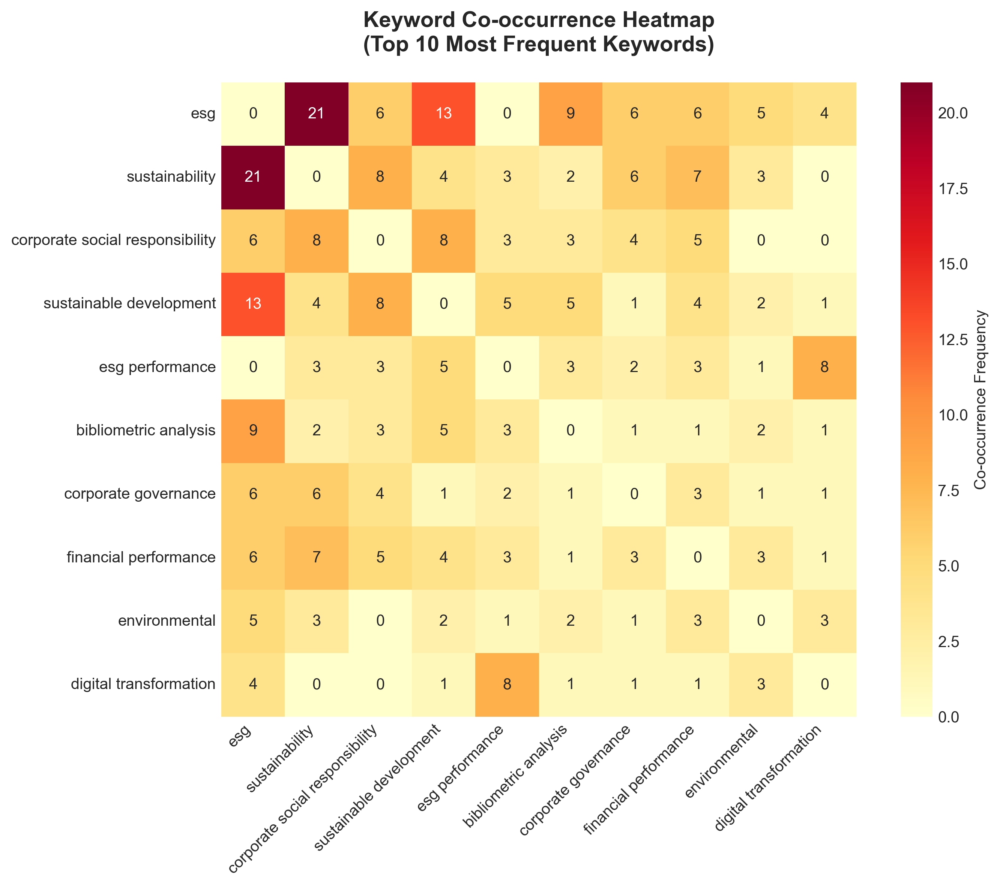

In [21]:
# 16. Keyword Co-Occurrence Heatmap (Top 10 Keywords)
if 'keywords' in df.columns:
    import numpy as np
    import seaborn as sns
    from itertools import combinations
    
    # Set style for publication quality
    plt.style.use('seaborn-v0_8-whitegrid')
    
    # Create co-occurrence matrix
    kw = df['keywords'].dropna().str.split(';').explode().str.strip().str.lower()
    top10 = kw.value_counts().head(10).index.tolist()
    idx = {k:i for i,k in enumerate(top10)}
    M = np.zeros((10,10), int)
    
    for kws in df['keywords'].dropna().str.split(';'):
        c = [k.strip().lower() for k in kws if k.strip().lower() in idx]
        for i,j in combinations(set(c),2):
            M[idx[i], idx[j]] += 1
            M[idx[j], idx[i]] += 1

    # Create figure with higher DPI for publication
    plt.figure(figsize=(10,8), dpi=300)
    
    # Create heatmap with enhanced styling
    sns.heatmap(M, 
                xticklabels=top10,
                yticklabels=top10,
                cmap='YlOrRd',
                annot=True,
                fmt='d',
                square=True,
                cbar_kws={'label': 'Co-occurrence Frequency'})

    # Rotate x-axis labels for better readability
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    
    # Add title and adjust layout
    plt.title('Keyword Co-occurrence Heatmap\n(Top 10 Most Frequent Keywords)',
              pad=20, fontsize=14, fontweight='bold')
    
    # Adjust layout to prevent label cutoff
    plt.tight_layout()
    
    plt.show()
else:
    print("No 'keywords' column found.")

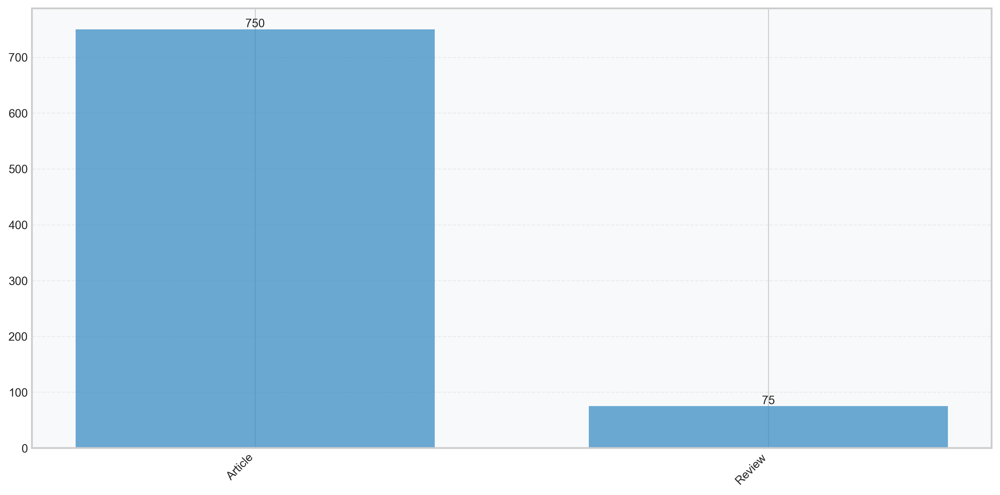

In [22]:
# 17. Document Type Distribution with Enhanced Visualization
plt.figure(figsize=(12, 6), dpi=300)  # Higher resolution for publication

# Get top 10 document types and their counts
doc_type_counts = df['document_type'].value_counts().head(10)

# Create bar plot with enhanced styling
bars = plt.bar(range(len(doc_type_counts)), 
               doc_type_counts.values,
               color='#2E86C1',  # Professional blue color
               alpha=0.7,
               width=0.7)

# Add value labels on top of bars
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height,
             f'{int(height)}',
             ha='center', va='bottom',
             fontsize=10)
             
# Set x-axis labels
plt.xticks(range(len(doc_type_counts)), 
           doc_type_counts.index,
           rotation=45,
           ha='right')

# Add grid for better readability
plt.grid(True, axis='y', linestyle='--', alpha=0.3)

# Customize spines
for spine in plt.gca().spines.values():
    spine.set_linewidth(1.5)

# Set background colors
plt.gca().set_facecolor('#f8f9fa')
plt.gcf().set_facecolor('white')

# Adjust layout to prevent label cutoff
plt.tight_layout()

plt.show()

In [23]:
# 18. Research Areas Frequency
if 'research_areas' in df.columns:
    ra = df['research_areas'].dropna().str.split(';').explode().str.strip()
    if len(ra) > 0:  # Check if there are any research areas
        top_ra = ra.value_counts().head(15)
        plt.figure(figsize=(8,5))
        top_ra.plot(kind='barh')
        plt.gca().invert_yaxis()
        plt.xlabel('Number of Papers')
        plt.title('Top 15 Research Areas')
        plt.tight_layout()
        plt.show()
    else:
        print("No research areas data found in the dataframe.")
else:
    print("No 'research_areas' column found.")

No research areas data found in the dataframe.


IndexError: index 0 is out of bounds for axis 0 with size 0

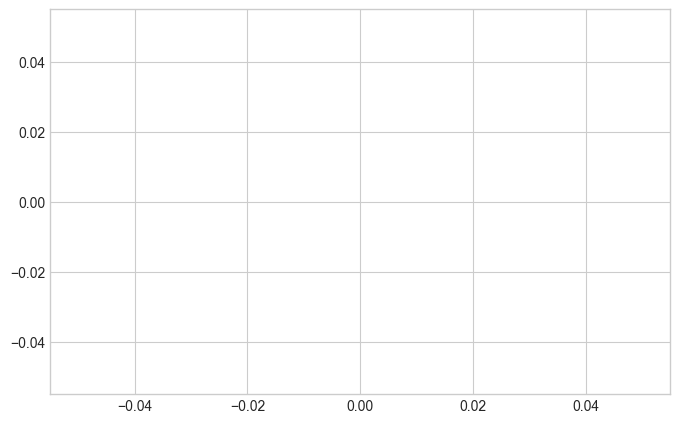

In [24]:
# 18. Research Areas Frequency
if 'research_areas' in df.columns:
    ra = df['research_areas'].dropna().str.split(';').explode().str.strip()
    top_ra = ra.value_counts().head(15)
    plt.figure(figsize=(8,5))
    top_ra.plot(kind='barh')
    plt.gca().invert_yaxis()
    plt.xlabel('Number of Papers')
    plt.title('Top 15 Research Areas')
    plt.tight_layout()
    plt.show()
else:
    print("No 'research_areas' column found.")

In [ ]:
df

,authors,author_full_names,authors_id,title,year,journal,volume,issue,art_no,page_start,...,research_areas,ids_number,pubmed_id,open_access_designations,highly_cited_status,hot_paper_status,date_of_export,ut_unique_wos_id,web_of_science_record,country
0,zeng h.; li r.y.m.; zeng l.,"Zeng, Huiling (57928967900); Li, Rita Yi Man (...",57928967900; 35189135600; 57745627500,evaluating green supply chain performance base...,2022,frontiers in environmental science,10.0,NaN,982828,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,China
1,li l.; liu x.; hu m.,"Li, Linze (57304193500); Liu, Xuexin (55750784...",57304193500; 55750784400; 57730231600,textile and apparel supply chain coordination ...,2024,journal of cleaner production,437.0,NaN,140491,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,China
2,karaman a.s.; ellili n.o.d.; uyar a.,"Karaman, Abdullah S. (36850344100); Ellili, Ne...",36850344100; 39261406000; 24448916800,do sustainable supply chain practices mitigate...,2024,business strategy and the environment,33.0,8,NaN,8126.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,France
3,memari z.; niazitabar m.; dickson g.; pouyande...,"Memari, Zhaleh (57219186290); Niazitabar, Mary...",57219186290; 59299328800; 7103204907; 57221603217,"corporate social responsibility, supply chain ...",2024,sport in society,27.0,10,NaN,1624.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Iran
4,ortas e.; álvarez i.; garayar a.,"Ortas, Eduardo (35737853000); Álvarez, Igor (5...",35737853000; 56522498600; 56523342900,"the environmental, social, governance, and fin...",2015,sustainability (switzerland),7.0,2,NaN,1932.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Spain
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
820,marano v.; sauerwald s.; van essen m.,"Marano, Valentina (35345178800); Sauerwald, St...",35345178800; 55315152800; 25947804200,the influence of culture on the relationship b...,2022,journal of international business studies,53.0,7,NaN,1315.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,United States
821,herghiligiu i.v.; robu i.-b.; istrate m.; gros...,"Herghiligiu, Ionuț Viorel (55513533600); Robu,...",55513533600; 6508310901; 56672996500; 56299809...,sustainable corporate performance based on aud...,2023,sustainability (switzerland),15.0,18,14033,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Romania
822,kobal grum d.; babnik k.,"Kobal Grum, Darja (13406287000); Babnik, Katar...",13406287000; 55619495600,the psychological concept of social sustainabi...,2022,frontiers in psychology,13.0,NaN,942204,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Slovenia
823,maseda a.; iturralde t.; cooper s.; aparicio g.,"Maseda, Amaia (30567581500); Iturralde, Txomin...",30567581500; 30467658800; 16067959600; 5654331...,mapping women's involvement in family firms: a...,2022,international journal of management reviews,24.0,2,NaN,279.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,United Kingdom


Text(0.5, 1.0, 'Open Access Types in ESG Research')

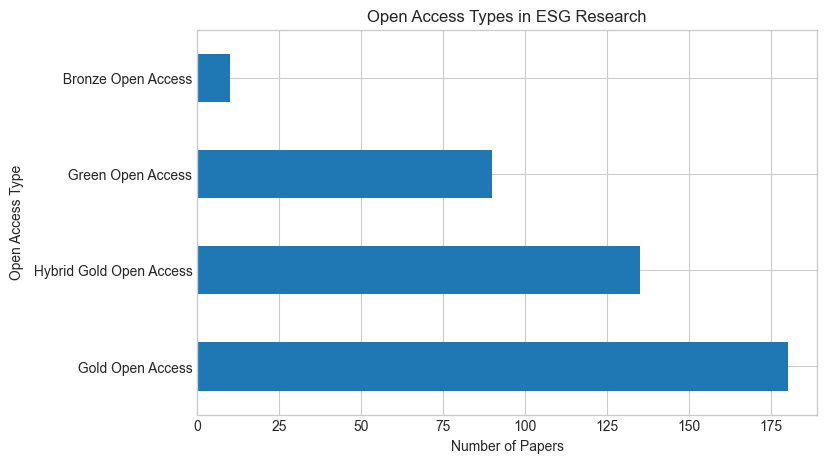

In [ ]:
df['open_access'].dropna().str.split(';').str[-1].value_counts().plot(kind='barh', figsize=(8,5))
plt.xlabel('Number of Papers')
plt.ylabel('Open Access Type')
plt.title('Open Access Types in ESG Research')

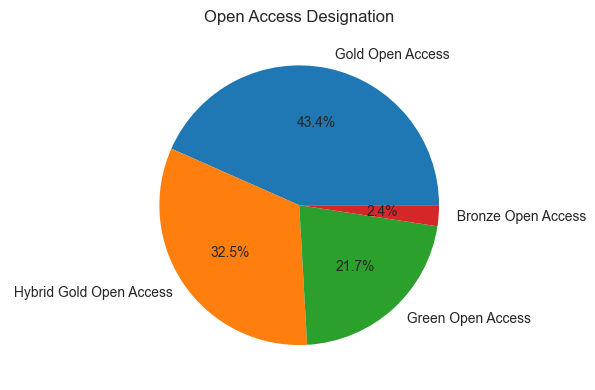

In [ ]:
# 19. Open Access vs. Closed Access
df['open_access'] = df['open_access'].dropna().str.split(';').str[-1]
plt.figure(figsize=(6,4))
df['open_access'].value_counts().plot(kind='pie', autopct='%1.1f%%')
plt.ylabel('')
plt.title('Open Access Designation')
plt.tight_layout()
plt.show()

In [ ]:
df.columns


Index(['authors', 'author_full_names', 'authors_id', 'title', 'year',
       'journal', 'volume', 'issue', 'art_no', 'page_start', 'page_end',
       'page_count', 'cited_by', 'doi', 'link', 'affiliations',
       'authors_with_affiliations', 'abstract', 'keywords', 'index_keywords',
       'correspondence_address', 'language_of_original_document',
       'abbreviated_source_title', 'document_type', 'publication_stage',
       'open_access', 'source', 'publication_type', 'book_authors',
       'book_editors', 'book_group_authors', 'book_author_full_names',
       'group_authors', 'article_title', 'source_title', 'book_series_title',
       'book_series_subtitle', 'language', 'conference_title',
       'conference_date', 'conference_location', 'conference_sponsor',
       'conference_host', 'keywords_plus', 'addresses', 'reprint_addresses',
       'email_addresses', 'researcher_ids', 'orcids', 'funding_orgs',
       'funding_name_preferred', 'funding_text', 'cited_references',
       'c

<Figure size 3600x1800 with 0 Axes>

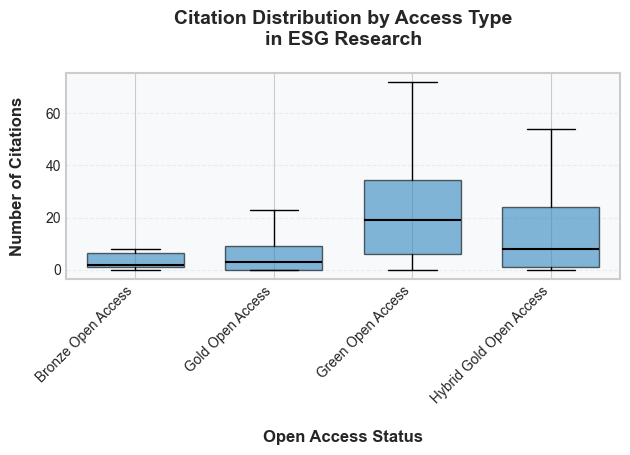

In [ ]:
# 20. Citations by Open Access Status with Enhanced Visualization
if 'cited_by' in df.columns and 'open_access' in df.columns:
    # Set style for publication quality
    plt.style.use('seaborn-v0_8-whitegrid')
    plt.figure(figsize=(12, 6), dpi=300)
    
    # Create boxplot with enhanced styling
    bp = df.dropna(subset=['cited_by','open_access']).boxplot(
        column='cited_by',
        by='open_access',
        showfliers=False,  # Remove outliers for better visualization
        patch_artist=True,  # Fill boxes with color
        medianprops=dict(color="black", linewidth=1.5),
        boxprops=dict(facecolor='#2E86C1', alpha=0.6),
        whiskerprops=dict(color='black'),
        capprops=dict(color='black'),
        widths=0.7
    )
    
    # Rotate x-axis labels for better readability
    plt.xticks(rotation=45, ha='right')
    
    # Customize axes labels and title
    plt.xlabel('Open Access Status', fontsize=12, fontweight='bold', labelpad=15)
    plt.ylabel('Number of Citations', fontsize=12, fontweight='bold', labelpad=15)
    plt.title('Citation Distribution by Access Type\nin ESG Research',
              fontsize=14, fontweight='bold', pad=20)
    
    # Remove automatic suptitle
    plt.suptitle('')
    
    # Customize grid
    plt.grid(True, axis='y', linestyle='--', alpha=0.3)
    
    # Customize spines
    for spine in plt.gca().spines.values():
        spine.set_linewidth(1.5)
    
    # Set background colors
    plt.gca().set_facecolor('#f8f9fa')
    plt.gcf().set_facecolor('white')
    
    # Adjust layout to prevent label cutoff
    plt.tight_layout()
    
    plt.show()
else:
    print("Required columns missing.")

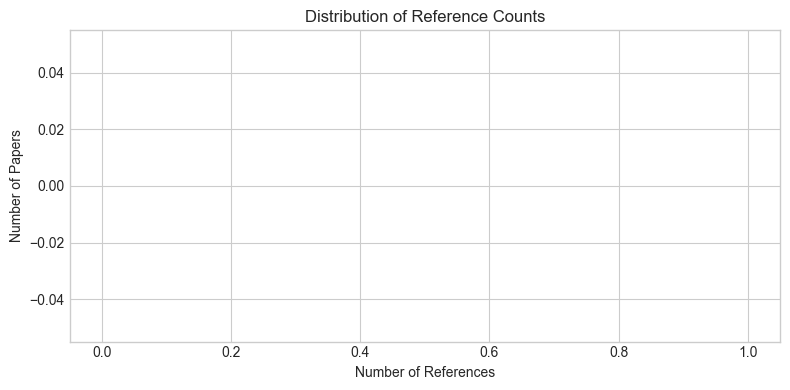

In [ ]:
# 21. Reference Count Distribution
if 'cited_reference_count' in df.columns:
    plt.figure(figsize=(8,4))
    df['cited_reference_count'].dropna().astype(int).hist(bins=30)
    plt.xlabel('Number of References')
    plt.ylabel('Number of Papers')
    plt.title('Distribution of Reference Counts')
    plt.tight_layout()
    plt.show()
else:
    print("No 'cited_reference_count' column found.")

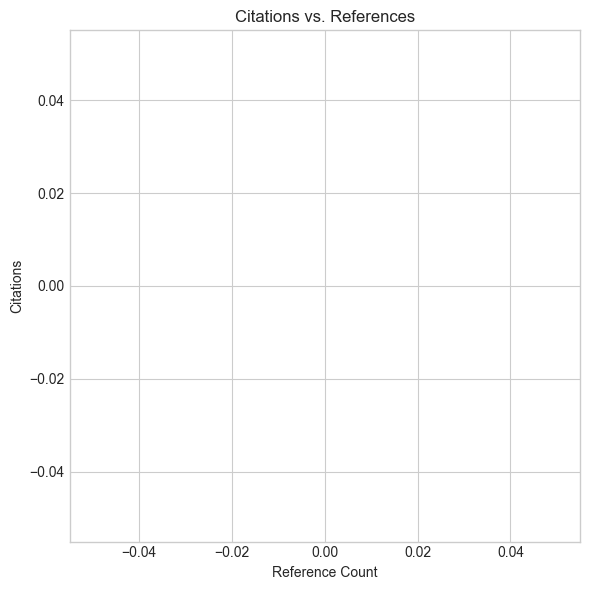

In [ ]:
# 22. Citations vs. References Scatter
if 'cited_by' in df.columns and 'cited_reference_count' in df.columns:
    plt.figure(figsize=(6,6))
    plt.scatter(df['cited_reference_count'], df['cited_by'], alpha=0.5)
    plt.xlabel('Reference Count')
    plt.ylabel('Citations')
    plt.title('Citations vs. References')
    plt.tight_layout()
    plt.show()
else:
    print("Required columns missing.")

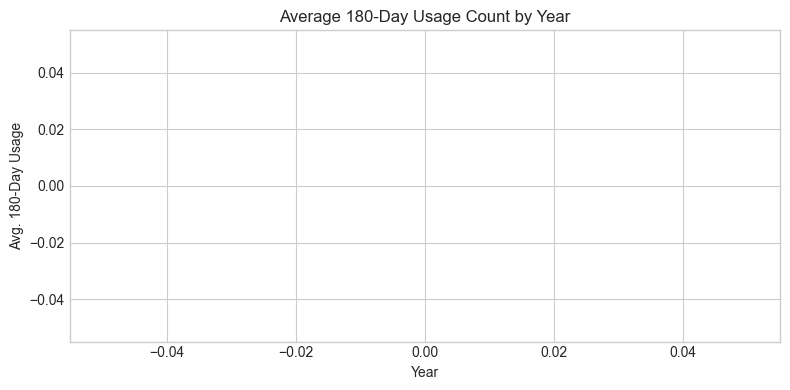

In [ ]:
# 23. 180-Day Usage Trend by Year
if '180_day_usage_count' in df.columns:
    usage = df.dropna(subset=['180_day_usage_count']).groupby('year')['180_day_usage_count'].mean()
    plt.figure(figsize=(8,4))
    usage.plot(marker='o')
    plt.xlabel('Year')
    plt.ylabel('Avg. 180-Day Usage')
    plt.title('Average 180-Day Usage Count by Year')
    plt.tight_layout()
    plt.show()
else:
    print("No '180_day_usage_count' column found.")

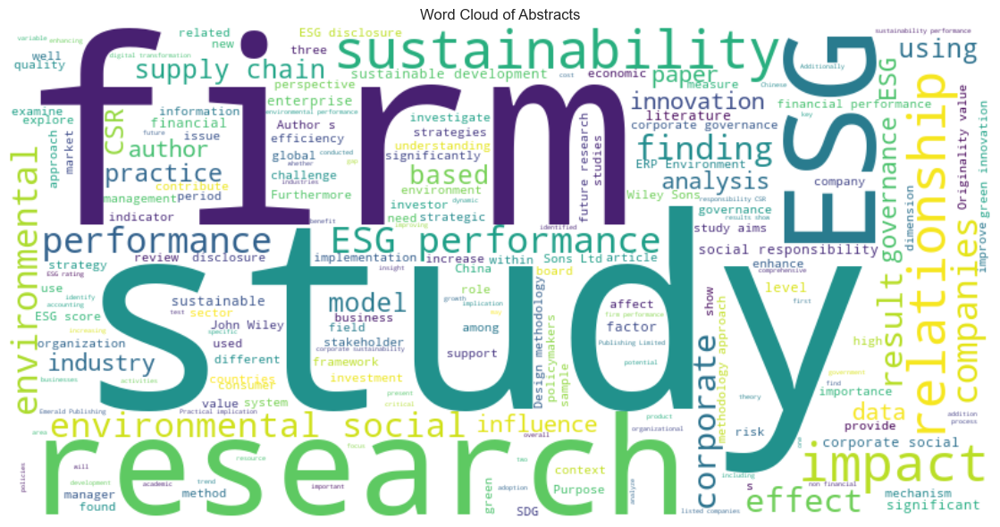

In [ ]:
# 24. Word Cloud of Abstracts
try:
    from wordcloud import WordCloud, STOPWORDS
    text = ' '.join(df['abstract'].dropna().tolist())
    wc = WordCloud(width=800, height=400,
                   stopwords=STOPWORDS, background_color='white').generate(text)
    plt.figure(figsize=(12,6))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis('off')
    plt.title('Word Cloud of Abstracts')
    plt.tight_layout()
    plt.show()
except ImportError:
    print("Install `wordcloud` to enable this cell.")

IndexError: index 0 is out of bounds for axis 0 with size 0

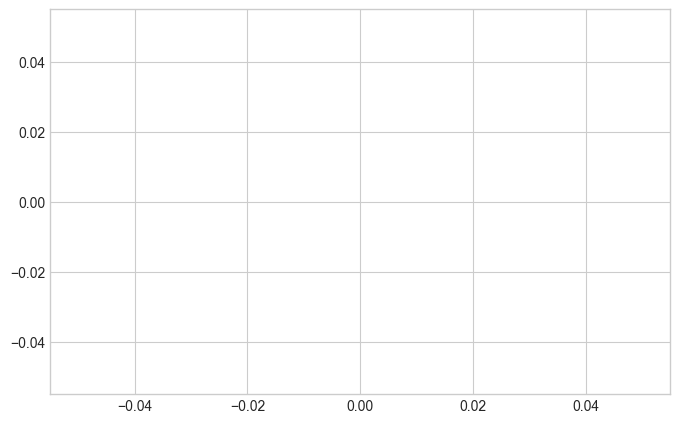

In [ ]:
# 25. Top Funding Organizations
if 'funding_name_preferred' in df.columns:
    fund = df['funding_name_preferred'].dropna().str.split(';').explode().str.strip()
    top_fund = fund.value_counts().head(10)
    plt.figure(figsize=(8,5))
    top_fund.plot(kind='barh')
    plt.gca().invert_yaxis()
    plt.xlabel('Number of Papers Funded')
    plt.title('Top 10 Funding Organizations')
    plt.tight_layout()
    plt.show()
else:
    print("No 'funding_name_preferred' column found.")

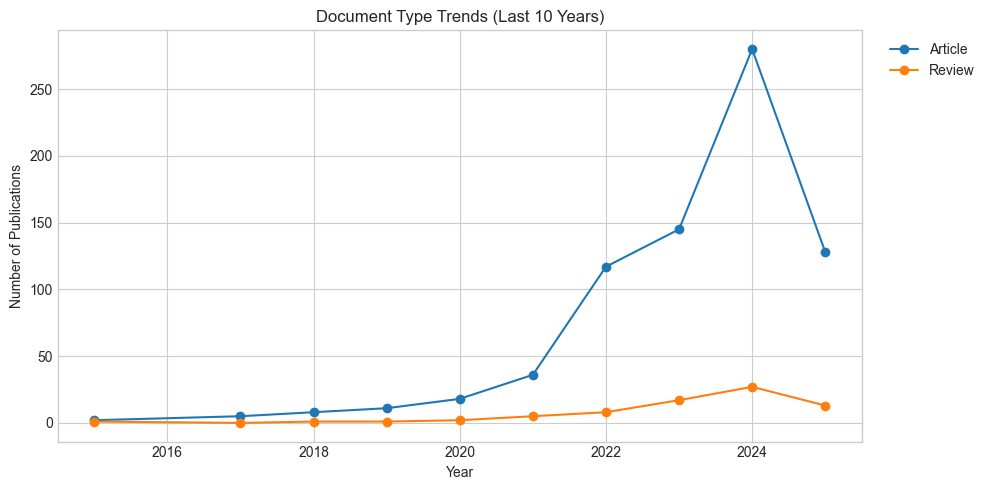

In [ ]:
# 26. Document Type Trends Over Time
doc_trend = (
    df.groupby(['year','document_type'])
      .size()
      .unstack(fill_value=0)
      .iloc[-10:]  # last 10 years
)
doc_trend.plot(figsize=(10,5), marker='o')
plt.xlabel('Year')
plt.ylabel('Number of Publications')
plt.title('Document Type Trends (Last 10 Years)')
plt.legend(bbox_to_anchor=(1.02,1), loc='upper left')
plt.tight_layout()
plt.show()